In [1]:
import folium
import pandas as pd
import geopandas as gpd

C:\Users\leopo\AppData\Local\Temp\ipykernel_26784\2125832005.py:3: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


# Visualisation

In [2]:
pgdf = pd.read_pickle("data/amenities_carreInspire200_paris.pkl")
pgdf.reset_index(inplace=True)
pgdf.set_geometry('geometry',inplace=True)

In [3]:
pgdf.keys()

Index(['geometry', 'IdINSPIRE', 'Id_carr1km', 'I_est_cr', 'Id_carr_n',
       'Groupe', 'Depcom', 'I_pauv', 'Id_car2010', 'Ind', 'Men', 'Men_pauv',
       'Men_1ind', 'Men_5ind', 'Men_prop', 'Men_fmp', 'Ind_snv', 'Men_surf',
       'Men_coll', 'Men_mais', 'Log_av45', 'Log_45_70', 'Log_70_90',
       'Log_ap90', 'Log_inc', 'Log_soc', 'Ind_0_3', 'Ind_4_5', 'Ind_6_10',
       'Ind_11_17', 'Ind_18_24', 'Ind_25_39', 'Ind_40_54', 'Ind_55_64',
       'Ind_65_79', 'Ind_80p', 'Ind_inc', 'I_est_1km', 'DEP', 'restaurant'],
      dtype='object')

<AxesSubplot: >

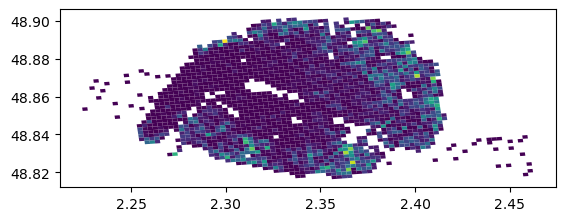

In [4]:
pgdf.plot(column = 'Log_soc')

In [5]:
m=folium.Map((48.8534100,2.3488000), zoom_start=12.1)

In [6]:
m = pgdf.explore(
    m = m,
    column = 'Log_soc',
    tooltip = 'Log_soc',
    tiles= "OpenStreetMap",
    popup = True,
    cmap = 'Set1',
    style_kwds = dict(color = "black",fillOpacity=0.4),
)
m

# Spatial Statistics

In [7]:
pgdf = pd.read_pickle("data/amenities_carreInspire200_paris.pkl")
pgdf.reset_index(inplace=True)
pgdf.set_geometry('geometry',inplace=True)

In [8]:
from pysal.lib import weights
import matplotlib.pyplot as plt

## Contiguity weights

In [9]:
w_queen = weights.contiguity.Queen.from_dataframe(pgdf) # adjacent in all directions, including diagonal.
# Replace Queen by rook for only up/down/left/right adjancy

c:\Users\leopo\anaconda3\envs\batomouche\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 33 disconnected components.
 There are 26 islands with ids: 196, 231, 744, 780, 813, 823, 836, 841, 862, 1019, 1020, 1060, 1063, 1071, 1100, 1259, 1349, 1404, 1601, 1681, 1754, 1766, 1769, 1779, 1781, 1788.
  warnings.warn(message)


c:\Users\leopo\anaconda3\envs\batomouche\lib\site-packages\libpysal\weights\weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
c:\Users\leopo\anaconda3\envs\batomouche\lib\site-packages\libpysal\weights\weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
c:\Users\leopo\anaconda3\envs\batomouche\lib\site-packages\libpysal\weights\weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
c:\Users\leopo\anaconda3\envs\batomouche\lib\site-packages\libpysal\weights\weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in 

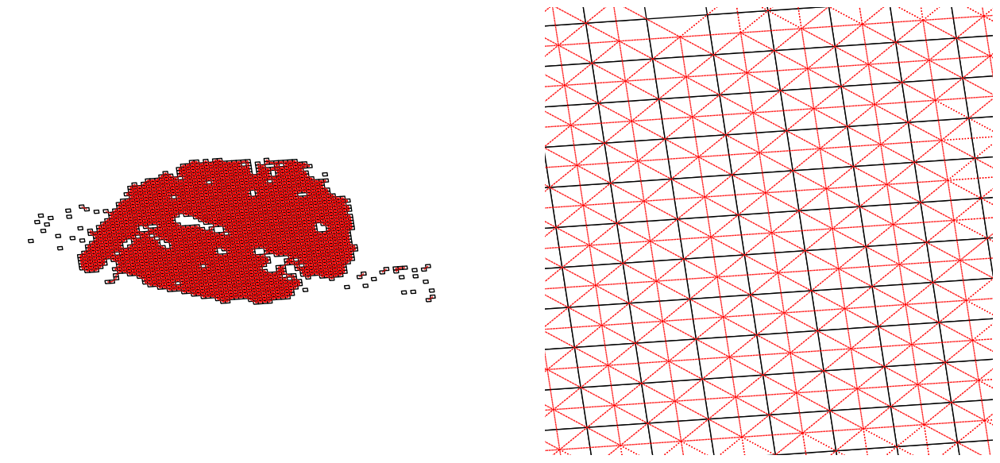

In [9]:
# Plot tract geography
f, axs = plt.subplots(1, 2, figsize=(16, 8))
for i in range(2):
    ax = pgdf.plot(
        edgecolor="k", facecolor="w", ax=axs[i]
    )
    # Plot graph connections
    w_queen.plot(
        pgdf,
        ax=axs[i],
        edge_kws=dict(color="r", linestyle=":", linewidth=1),
        node_kws=dict(marker=""),
    )
    # Remove the axis
    axs[i].set_axis_off()
axs[1].axis([2.35, 2.37,48.86, 48.88]);


## Moran statistics

### One example : restaurants

In [10]:
from pysal.explore import esda

c:\Users\leopo\anaconda3\envs\batomouche\lib\site-packages\spaghetti\network.py:39: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(f"{dep_msg}", FutureWarning)


In [11]:
w_queen.transform = "R"
moran = esda.moran.Moran(pgdf["restaurant"], w_queen)

('WARNING: ', 196, ' is an island (no neighbors)')
('WARNING: ', 231, ' is an island (no neighbors)')
('WARNING: ', 744, ' is an island (no neighbors)')
('WARNING: ', 780, ' is an island (no neighbors)')
('WARNING: ', 813, ' is an island (no neighbors)')
('WARNING: ', 823, ' is an island (no neighbors)')
('WARNING: ', 836, ' is an island (no neighbors)')
('WARNING: ', 841, ' is an island (no neighbors)')
('WARNING: ', 862, ' is an island (no neighbors)')
('WARNING: ', 1019, ' is an island (no neighbors)')
('WARNING: ', 1020, ' is an island (no neighbors)')
('WARNING: ', 1060, ' is an island (no neighbors)')
('WARNING: ', 1063, ' is an island (no neighbors)')
('WARNING: ', 1071, ' is an island (no neighbors)')
('WARNING: ', 1100, ' is an island (no neighbors)')
('WARNING: ', 1259, ' is an island (no neighbors)')
('WARNING: ', 1349, ' is an island (no neighbors)')
('WARNING: ', 1404, ' is an island (no neighbors)')
('WARNING: ', 1601, ' is an island (no neighbors)')
('WARNING: ', 1681, '

In [12]:
print("Moran's I", moran.I,"Moran's simulated p-value",moran.p_sim)

Moran's I 0.5064397468532207 Moran's simulated p-value 0.001


On peut rejeter au niveau de 1% que la distribution des restaurants est aléatoire.

(<Figure size 1000x400 with 2 Axes>,
 array([<AxesSubplot: title={'center': 'Reference Distribution'}, xlabel='Moran I: 0.51', ylabel='Density'>,
        <AxesSubplot: title={'center': 'Moran Scatterplot (0.51)'}, xlabel='Attribute', ylabel='Spatial Lag'>],
       dtype=object))

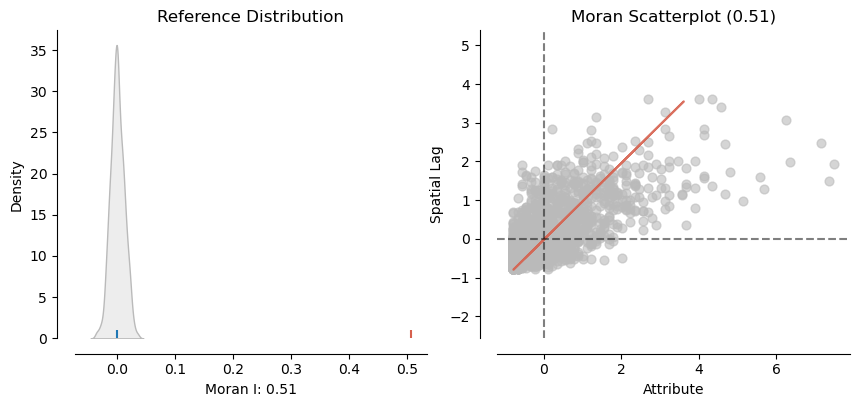

In [13]:
from splot.esda import plot_moran
plot_moran(moran)

### On every variable

In [14]:
def moran_by_col(y, w=w_queen):
    mo = esda.Moran(y, w=w)
    mo_s = pd.Series(
        {"I": mo.I, "I-P value": mo.p_sim},
    )
    return mo_s

In [15]:
pgdf.keys()

Index(['geometry', 'IdINSPIRE', 'Id_carr1km', 'I_est_cr', 'Id_carr_n',
       'Groupe', 'Depcom', 'I_pauv', 'Id_car2010', 'Ind', 'Men', 'Men_pauv',
       'Men_1ind', 'Men_5ind', 'Men_prop', 'Men_fmp', 'Ind_snv', 'Men_surf',
       'Men_coll', 'Men_mais', 'Log_av45', 'Log_45_70', 'Log_70_90',
       'Log_ap90', 'Log_inc', 'Log_soc', 'Ind_0_3', 'Ind_4_5', 'Ind_6_10',
       'Ind_11_17', 'Ind_18_24', 'Ind_25_39', 'Ind_40_54', 'Ind_55_64',
       'Ind_65_79', 'Ind_80p', 'Ind_inc', 'I_est_1km', 'DEP', 'restaurant'],
      dtype='object')

In [16]:
var_socioeco = ['Ind', 'Men', 'Men_pauv',
       'Men_1ind', 'Men_5ind', 'Men_prop', 'Men_fmp', 'Ind_snv', 'Men_surf',
       'Men_coll', 'Men_mais', 'Log_av45', 'Log_45_70', 'Log_70_90',
       'Log_ap90', 'Log_inc', 'Log_soc', 'Ind_0_3', 'Ind_4_5', 'Ind_6_10',
       'Ind_11_17', 'Ind_18_24', 'Ind_25_39', 'Ind_40_54', 'Ind_55_64',
       'Ind_65_79', 'Ind_80p', 'Ind_inc']
var_interet = ['restaurant']
var = var_interet+var_socioeco

il faudrait sans doute mettre en relatif au nombre d'individus les indicateurs utilisés.

In [17]:
moran_stats = pgdf[var].apply(moran_by_col, axis = 0).T

moran_stats

,I,I-P value
restaurant,0.506440,0.001
Ind,0.471484,0.001
Men,0.503430,0.001
Men_pauv,0.481380,0.001
Men_1ind,0.519040,0.001
Men_5ind,0.386353,0.001
Men_prop,0.495755,0.001
Men_fmp,0.414072,0.001
Ind_snv,0.466396,0.001
Men_surf,0.423044,0.001


Globalement les différentes distributions peuvent être considérée comme non aléatoire au seuil de 1%. (une donnée au seuil de 5%)

## Spatial Gini Coef

In [18]:
from inequality.gini import Gini_Spatial

def gini_spatial_by_col(incomes, weights = w_queen):
    gs = Gini_Spatial(incomes, weights)
    denom = 2 * incomes.mean() * weights.n ** 2
    near_diffs = gs.wg / denom
    far_diffs = gs.wcg / denom
    out = pd.Series(
        {
            "gini": gs.g,
            "near_diffs": near_diffs,
            "far_diffs": far_diffs,
            "p_sim": gs.p_sim,
        }
    )
    return out

In [20]:
pgdf['mean_income'] = pgdf["Ind_snv"]/pgdf['Ind']
pgdf['mean_log_soc'] = pgdf["Log_soc"]/pgdf["Ind"]

In [21]:
spatial_gini_results = (
    pgdf[["mean_log_soc","Log_soc"]].apply(gini_spatial_by_col).T
)
spatial_gini_results

,gini,near_diffs,far_diffs,p_sim
mean_log_soc,0.656887,0.001426,0.655462,0.01
Log_soc,0.694823,0.001798,0.693025,0.01


il y a une très forte inégalités de distribution des restaurants. Par contre en terme de revenue moyen, on est plutôt sur une distribution assez homogène à Paris. On voit aussi que l'essentiel s'explique par une inégalité entre les carrés non voisins, ce qui correspond bien à ce qu'on a pour l'instant mis en évidence.

# Calculate index accessibility

In [33]:
import helpers as hs
from importlib import reload
import folium
import pandas as pd
import geopandas as gpd
reload(hs)

--- Import helpers ---


<module 'helpers' from 'c:\\Users\\leopo\\OneDrive - GENES\\StatApp\\BATO-MOUCHE-Stat-App\\helpers\\__init__.py'>

In [34]:
pgdf = pd.read_pickle("data/amenities_carreInspire200_paris.pkl")
pgdf.reset_index(inplace=True)
pgdf.set_geometry('geometry',inplace=True)

In [32]:
pgdf.keys()

Index(['index', 'geometry', 'Id_carr1km', 'I_est_cr', 'Id_carr_n', 'Groupe',
       'Depcom', 'I_pauv', 'Id_car2010', 'Ind', 'Men', 'Men_pauv', 'Men_1ind',
       'Men_5ind', 'Men_prop', 'Men_fmp', 'Ind_snv', 'Men_surf', 'Men_coll',
       'Men_mais', 'Log_av45', 'Log_45_70', 'Log_70_90', 'Log_ap90', 'Log_inc',
       'Log_soc', 'Ind_0_3', 'Ind_4_5', 'Ind_6_10', 'Ind_11_17', 'Ind_18_24',
       'Ind_25_39', 'Ind_40_54', 'Ind_55_64', 'Ind_65_79', 'Ind_80p',
       'Ind_inc', 'I_est_1km', 'DEP', 'restaurant', 'Log_soc_access'],
      dtype='object')

### Decay matrix using the Paris streets network : too long, need optimization

In [ ]:
# on va utiliser la distance entre deux coordonnées sur le réseau de routiers parisiens
# import helpers as hs
# import numpy as np
# from importlib import reload
# import osmnx as onx
# from scipy.spatial.distance import pdist,squareform
# walk_network = onx.graph.graph_from_place("Paris,Ile-de-France,France",network_type="walk")
# max_length = 1000
# pgdf['center'] = pgdf['geometry'].centroid
# metric = lambda c1,c2: hs.distance_between_coordinates(streets=walk_network,coord1 = c1, coord2= c2, limit=max_length)
# coordinates = np.array([pgdf['center'].values[:].x,pgdf['center'].values[:].y]).transpose()
# network_dist = pdist(coordinates, metric=metric)
# np.save("data/distance_network_matrix_paris.pkl",squareform(network_dist))
# problème : consomme trop  de temps pour probablement un intérêt limité

### two-step floating catchment area method (2SFCA)

#### Weight calcul

In [35]:
# weights can be a bit long so it's preferable to create a variable
idCol = "IdINSPIRE"
weights_by_id = hs.calculate_distanceband_weights(pgdf,idCol=idCol) 
# note it sets the idCol as index for the rest of the program to work weights_by_id and gdf needs to have the same index

##### Vérifions de la cohérence

In [36]:
m=folium.Map((48.8534100,2.3488000), zoom_start=12.1)
m = pgdf[["geometry"]].assign(weight_0 = weights_by_id[pgdf.index[0]].values).explore(
    m = m,
    column = 'weight_0',
    tooltip = 'weight_0',
    tiles= "OpenStreetMap",
    popup = True,
    cmap = 'plasma',
    style_kwds = dict(color = "black",fillOpacity=0.4),
)
m

In [26]:
pgdf.iloc[0]['geometry'].centroid.y,pgdf.iloc[0]['geometry'].centroid.x


(48.89484726979563, 2.380955020172673)

On a vérifié sur une carte que ça correspond à la bonne position.

#### Calculate accessibility

In [37]:
interestVar = ['Log_soc']
accessibility_measures = hs.calculate_2SFCA_accessibility(pgdf,interestVar,weights_by_id)

In [38]:
for var in interestVar:
    pgdf[var+"_access"] = accessibility_measures[var]

In [39]:
m=folium.Map((48.8534100,2.3488000), zoom_start=12.1)
m = pgdf.explore(
    m = m,
    column = 'Log_soc_access',
    tooltip = 'Log_soc_access',
    tiles= "OpenStreetMap",
    popup = True,
    cmap = 'Set1',
    style_kwds = dict(color = "black",fillOpacity=0.4),
)
m

On voit qu'il y a un effet centre qui vraiment très important à Paris. Et pourtant cela ne représente pas forcémement le dynamique de tous les quartiers.

# Regression
On peut faire des régressions sur les différents index à partir des données socio économiques par exemple.

# Clustering